# Retail Data Wrangling and Analytics

###  Notebook Summary

This notebook loads retail transaction data from PostgreSQL into PySpark, cleans and prepares the dataset, and performs business-oriented customer analytics. It covers monthly sales trends, sales growth, monthly active users, new vs existing customers, placed vs canceled orders, invoice value distribution, and RFM-based customer segmentation. The goal is to transform raw retail transactions into clean analytical outputs and customer insights that support business performance evaluation and decision-making.


## Import libraries
##### Imported PySpark functions and plotting libraries.

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.window import Window
from pyspark.sql.types import *
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.ticker import FuncFormatter


##  Data ingestion
##### Loading the retail data from Psql database to Pyspark DF using JDBC connection

In [0]:
my_df = (
    spark.read
    .format("jdbc")
    .option("url", "jdbc:postgresql://34.130.29.48:5432/postgres")
    .option("dbtable", "public.retail")
    .option("user", "postgres")
    .option("password", "password")
    .option("driver", "org.postgresql.Driver")
    .load()
)

display(my_df)

invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
499982,21700,BIG DOUGHNUT FRIDGE MAGNETS,12,2010-03-03T15:56:00.000Z,0.85,12681.0,France
499982,85217,ASSORTED ICE CREAM FRIDGE MAGNETS,12,2010-03-03T15:56:00.000Z,0.65,12681.0,France
499982,22181,SNOWSTORM PHOTO FRAME FRIDGE MAGNET,12,2010-03-03T15:56:00.000Z,0.85,12681.0,France
499982,22312,OFFICE MUG WARMER POLKADOT,10,2010-03-03T15:56:00.000Z,4.95,12681.0,France
499982,22313,OFFICE MUG WARMER PINK,8,2010-03-03T15:56:00.000Z,4.95,12681.0,France
499982,22314,OFFICE MUG WARMER CHOC+BLUE,2,2010-03-03T15:56:00.000Z,4.95,12681.0,France
499982,22365,DOOR MAT RESPECTABLE HOUSE,4,2010-03-03T15:56:00.000Z,7.49,12681.0,France
499982,21077,SET/20 WOODLAND PAPER NAPKINS,12,2010-03-03T15:56:00.000Z,0.85,12681.0,France
499982,21719,LOVELY BONBON STICKER SHEET,12,2010-03-03T15:56:00.000Z,0.85,12681.0,France
499982,21721,CANDY SHOP STICKER SHEET,12,2010-03-03T15:56:00.000Z,0.85,12681.0,France


# EDA (Exploratory Data Analysis)

In [0]:
# Basic shape and schema
print("Rows:", my_df.count())
print("Columns:", len(my_df.columns))
print("Column names:", my_df.columns)
my_df.printSchema()

Rows: 1067371
Columns: 8
Column names: ['invoice_no', 'stock_code', 'description', 'quantity', 'invoice_date', 'unit_price', 'customer_id', 'country']
root
 |-- invoice_no: string (nullable = true)
 |-- stock_code: string (nullable = true)
 |-- description: string (nullable = true)
 |-- quantity: integer (nullable = true)
 |-- invoice_date: timestamp (nullable = true)
 |-- unit_price: float (nullable = true)
 |-- customer_id: float (nullable = true)
 |-- country: string (nullable = true)



#### Create working dataframe

In [0]:
df = my_df 
display(df)

invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
501007,82581,TOILET METAL SIGN,1,2010-03-11T14:51:00.000Z,0.55,16126.0,United Kingdom
501007,82583,HOT BATHS METAL SIGN,1,2010-03-11T14:51:00.000Z,2.1,16126.0,United Kingdom
501007,85176,SEWING SUSAN 21 NEEDLE SET,12,2010-03-11T14:51:00.000Z,0.85,16126.0,United Kingdom
501007,85178,VICTORIAN SEWING KIT,12,2010-03-11T14:51:00.000Z,1.25,16126.0,United Kingdom
501007,47504E,ENGLISH ROSE SCISSORS,2,2010-03-11T14:51:00.000Z,1.25,16126.0,United Kingdom
501007,20738,GREEN MINI TAPE MEASURE,7,2010-03-11T14:51:00.000Z,0.85,16126.0,United Kingdom
501007,20733,GOLD MINI TAPE MEASURE,10,2010-03-11T14:51:00.000Z,0.85,16126.0,United Kingdom
501007,20734,SILVER MINI TAPE MEASURE,10,2010-03-11T14:51:00.000Z,0.85,16126.0,United Kingdom
501007,47504G,ENGLISH ROSE TAPE MEASURE,3,2010-03-11T14:51:00.000Z,1.25,16126.0,United Kingdom
501007,20735,BLACK MINI TAPE MEASURE,6,2010-03-11T14:51:00.000Z,0.85,16126.0,United Kingdom


#### Drop rows with missing customer_id

In [0]:
df = df.filter(F.col("customer_id").isNotNull())
print("Rows after removing null customer_id:", df.count())

Rows after removing null customer_id: 824364


#### Remove cancelled invoices

In [0]:
# Cancelled invoices start with C
df = df.filter(~F.col("invoice_no").startswith("C"))
print("Rows after removing cancelled invoices:", df.count())

Rows after removing cancelled invoices: 805620


#### Remove invalid quantity

In [0]:
# Remove zero or negative quantity:
df = df.filter(F.col("quantity") > 0)
print("Rows after removing invalid quantity:", df.count())

Rows after removing invalid quantity: 805620


#### Remove invalid price

In [0]:
# Remove zero or negative price:
df = df.filter(F.col("unit_price") > 0)
print("Rows after removing invalid unit_price:", df.count())

Rows after removing invalid unit_price: 805549


#### Remove duplicates

In [0]:
before = df.count()
df = df.dropDuplicates()
after = df.count()
print("Duplicates removed:", before - after)

Duplicates removed: 26124


#### Create sales_amount column

In [0]:
df = df.withColumn(
    "sales_amount",
    F.col("quantity") * F.col("unit_price")
)

display(df)

invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country,sales_amount
502063,21457,2 PICTURE BOOK EGGS EASTER DUCKS,12,2010-03-22T15:08:00.000Z,1.25,14355.0,United Kingdom,15.0
502089,22231,JIGSAW TREE WITH BIRDHOUSE,12,2010-03-22T16:04:00.000Z,1.45,14307.0,United Kingdom,17.40000057220459
502258,84997B,RED 3 PIECE MINI DOTS CUTLERY SET,2,2010-03-23T15:10:00.000Z,3.75,14166.0,United Kingdom,7.5
502491,22079,RIBBON REEL HEARTS DESIGN,10,2010-03-25T10:20:00.000Z,1.65,12471.0,Germany,16.49999976158142
502588,21156,RED SPOTTY CHILDS APRON,6,2010-03-25T12:43:00.000Z,1.95,16550.0,United Kingdom,11.700000286102295
502595,21793,CLASSIC FRENCH STYLE BASKET BROWN,2,2010-03-25T13:13:00.000Z,6.75,14911.0,EIRE,13.5
502758,85099F,JUMBO BAG STRAWBERRY,100,2010-03-26T13:45:00.000Z,1.65,14646.0,Netherlands,164.9999976158142
502837,85060,WOOD FAN WITH FLOWER DESIGN,12,2010-03-28T12:52:00.000Z,1.25,14771.0,United Kingdom,15.0
502870,20969,RED FLORAL FELTCRAFT SHOULDER BAG,4,2010-03-28T16:17:00.000Z,3.75,13373.0,United Kingdom,15.0
502915,84682,CLASSICAL ROSE DISH,6,2010-03-29T13:36:00.000Z,2.95,17920.0,United Kingdom,17.700000286102295


#### Extract date features

In [0]:
df = df.withColumn("year", F.year("invoice_date")) \
       .withColumn("month", F.month("invoice_date")) \
       .withColumn("year_month", F.date_format("invoice_date", "yyyy-MM"))
display(df)

invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country,sales_amount,year,month,year_month
502063,21457,2 PICTURE BOOK EGGS EASTER DUCKS,12,2010-03-22T15:08:00.000Z,1.25,14355.0,United Kingdom,15.0,2010,3,2010-03
502089,22231,JIGSAW TREE WITH BIRDHOUSE,12,2010-03-22T16:04:00.000Z,1.45,14307.0,United Kingdom,17.40000057220459,2010,3,2010-03
502258,84997B,RED 3 PIECE MINI DOTS CUTLERY SET,2,2010-03-23T15:10:00.000Z,3.75,14166.0,United Kingdom,7.5,2010,3,2010-03
502491,22079,RIBBON REEL HEARTS DESIGN,10,2010-03-25T10:20:00.000Z,1.65,12471.0,Germany,16.49999976158142,2010,3,2010-03
502588,21156,RED SPOTTY CHILDS APRON,6,2010-03-25T12:43:00.000Z,1.95,16550.0,United Kingdom,11.700000286102295,2010,3,2010-03
502595,21793,CLASSIC FRENCH STYLE BASKET BROWN,2,2010-03-25T13:13:00.000Z,6.75,14911.0,EIRE,13.5,2010,3,2010-03
502758,85099F,JUMBO BAG STRAWBERRY,100,2010-03-26T13:45:00.000Z,1.65,14646.0,Netherlands,164.9999976158142,2010,3,2010-03
502837,85060,WOOD FAN WITH FLOWER DESIGN,12,2010-03-28T12:52:00.000Z,1.25,14771.0,United Kingdom,15.0,2010,3,2010-03
502870,20969,RED FLORAL FELTCRAFT SHOULDER BAG,4,2010-03-28T16:17:00.000Z,3.75,13373.0,United Kingdom,15.0,2010,3,2010-03
502915,84682,CLASSICAL ROSE DISH,6,2010-03-29T13:36:00.000Z,2.95,17920.0,United Kingdom,17.700000286102295,2010,3,2010-03


# Total Invoice Amount Distribution

In [0]:

# Calculate invoice amount
invoice_amount_df = (
    df.groupBy("invoice_no")
      .agg(F.round(F.sum("sales_amount"), 2).alias("Amount"))
)


In [0]:
# Helper function for plot histogram + boxplot
def plot_distribution(spark_df, col_name="Amount", title_suffix=""):
    stats = spark_df.select(
        F.min(col_name).alias("min"),
        F.round(F.avg(col_name), 2).alias("mean"),
        F.expr(f"percentile_approx({col_name}, 0.5)").alias("median"),
        F.max(col_name).alias("max")
    ).collect()[0]

    mode_val = (
        spark_df.groupBy(col_name)
        .count()
        .orderBy(F.desc("count"), F.asc(col_name))
        .first()[0]
    )

    print(f"Minimum:{stats['min']:.2f}")
    print(f"Mean:{stats['mean']:.2f}")
    print(f"Median:{stats['median']:.2f}")
    print(f"Mode:{mode_val:.2f}")
    print(f"Maximum:{stats['max']:.2f}")

    pdf = spark_df.select(col_name).toPandas()

    fig, ax = plt.subplots(2, 1, figsize=(10, 6))

    ax[0].hist(pdf[col_name], bins=50, edgecolor="black")
    ax[0].set_title(f"Data Distribution{title_suffix}")
    ax[0].set_xlabel("Invoice Amount")
    ax[0].set_ylabel("Frequency")

    ax[1].boxplot(pdf[col_name], vert=False)
    ax[1].set_title(f"Box Plot{title_suffix}")
    ax[1].set_xlabel("Invoice Amount")

    plt.tight_layout()
    plt.show()



Minimum:0.38
Mean:469.98
Median:303.04
Mode:15.00
Maximum:168469.59


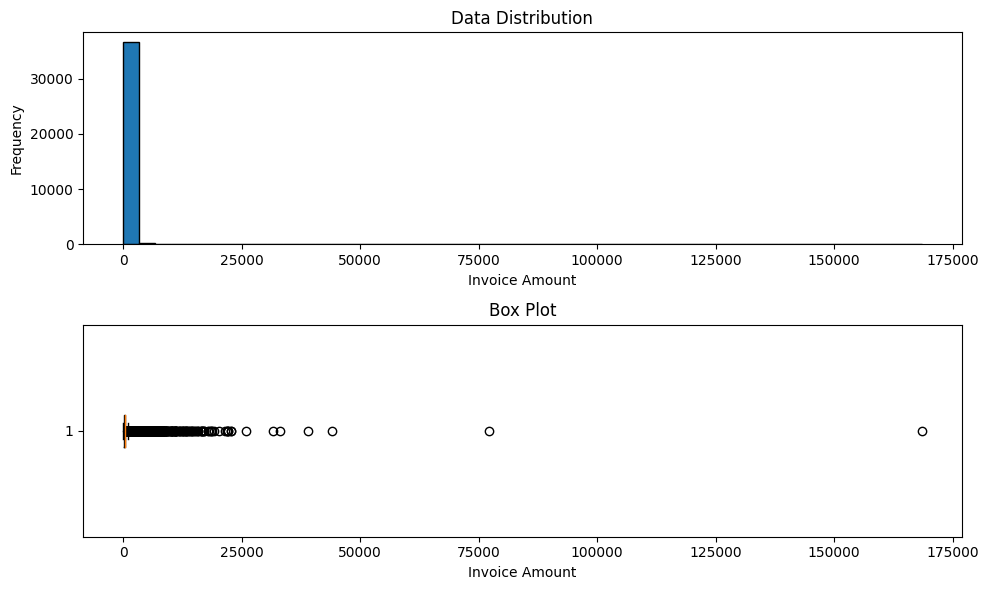

In [0]:
# Plot full distribution
plot_distribution(invoice_amount_df)

Minimum:0.38
Mean:267.35
Median:256.20
Mode:15.00
Maximum:660.00


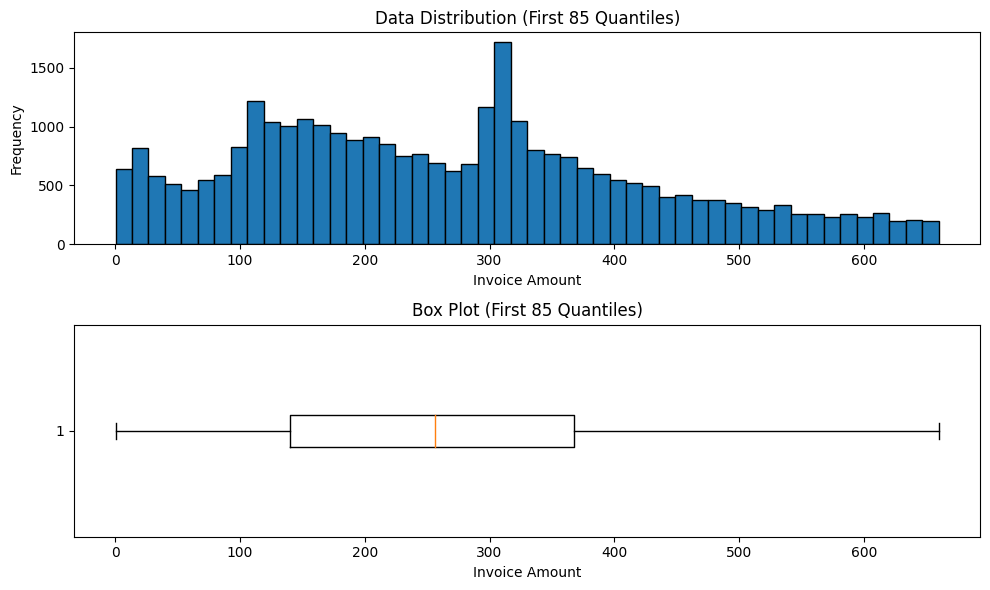

In [0]:
# Ploting first 85 quantiles
upper_85 = invoice_amount_df.approxQuantile("Amount", [0.85], 0.0)[0]
invoice_amount_85_df = invoice_amount_df.filter(F.col("Amount") <= upper_85)

plot_distribution(invoice_amount_85_df, title_suffix=" (First 85 Quantiles)")

# Monthly Placed and Canceled Orders

In [0]:
# ==================================================
# Monthly Placed and Canceled Orders
# ==================================================

# Ensure invoice_date is timestamp
orders_df = (
    my_df
    .withColumn("invoice_date", F.to_timestamp("invoice_date"))
    .withColumn("yyyymm", F.year("invoice_date") * 100 + F.month("invoice_date"))
    .withColumn("is_canceled", F.col("invoice_no").startswith("C"))
)

# Count unique placed (non-canceled) invoices per month
placed_orders_df = (
    orders_df
    .filter(~F.col("is_canceled"))
    .groupBy("yyyymm")
    .agg(F.countDistinct("invoice_no").alias("placed_orders"))
)

# Count unique canceled invoices per month
canceled_orders_df = (
    orders_df
    .filter(F.col("is_canceled"))
    .groupBy("yyyymm")
    .agg(F.countDistinct("invoice_no").alias("canceled_orders"))
)

# Merging both 
monthly_orders_df = (
    placed_orders_df
    .join(canceled_orders_df, on="yyyymm", how="full")
    .fillna(0, subset=["placed_orders", "canceled_orders"])
    .orderBy("yyyymm")
)

display(monthly_orders_df)

yyyymm,placed_orders,canceled_orders
200912,1929,401
201001,1333,300
201002,1729,240
201003,1960,407
201004,1588,304
201005,2011,407
201006,1859,357
201007,1673,344
201008,1604,273
201009,2004,371


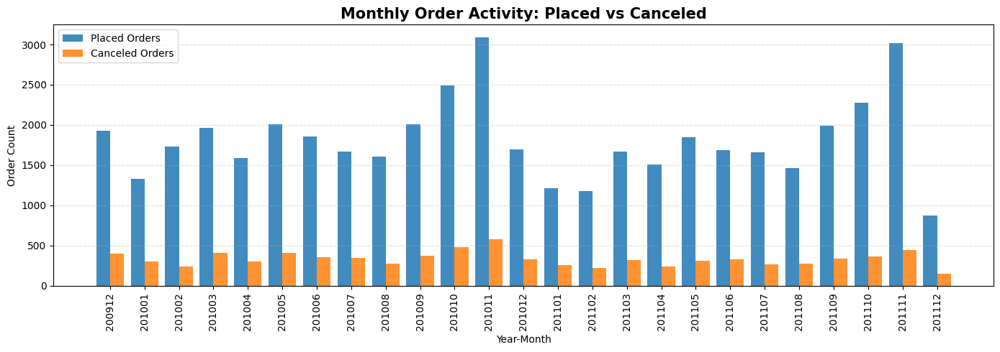

In [0]:
monthly_orders_pd = monthly_orders_df.toPandas()

x_labels = monthly_orders_pd["yyyymm"].astype(str).tolist()
x = np.arange(len(x_labels))
bar_width = 0.4

plt.figure(figsize=(14, 5))

plt.bar(
    x - bar_width / 2,
    monthly_orders_pd["placed_orders"],
    width=bar_width,
    label="Placed Orders",
    alpha=0.85
)

plt.bar(
    x + bar_width / 2,
    monthly_orders_pd["canceled_orders"],
    width=bar_width,
    label="Canceled Orders",
    alpha=0.85
)

plt.title("Monthly Order Activity: Placed vs Canceled", fontsize=15, fontweight="bold")
plt.xlabel("Year-Month")
plt.ylabel("Order Count")
plt.xticks(x, x_labels, rotation=90)
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()

# Monthly Sales

In [0]:
# Monthly sales trend using cleaned dataframe
monthly_sales_df = (
    df
    .withColumn("yyyymm", F.year("invoice_date") * 100 + F.month("invoice_date"))
    .groupBy("yyyymm")
    .agg(F.round(F.sum("sales_amount"), 2).alias("sales_amount"))
    .orderBy("yyyymm")
)

display(monthly_sales_df.limit(5))

yyyymm,sales_amount
200912,683504.01
201001,555802.67
201002,504558.95
201003,696978.47
201004,591982.0


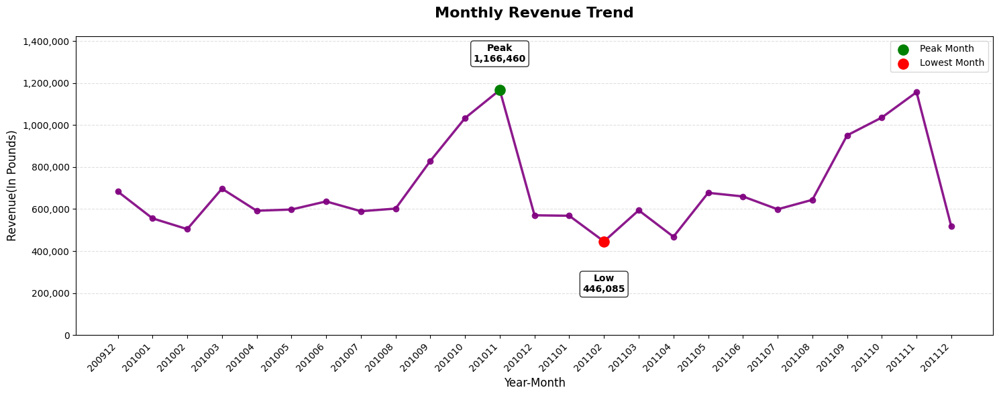

In [0]:
from matplotlib.ticker import FuncFormatter

monthly_sales_pd = monthly_sales_df.toPandas()
monthly_sales_pd["yyyymm"] = monthly_sales_pd["yyyymm"].astype(str)

peak_idx = monthly_sales_pd["sales_amount"].idxmax()
low_idx = monthly_sales_pd["sales_amount"].idxmin()

plt.figure(figsize=(15, 6))

plt.plot(
    monthly_sales_pd["yyyymm"],
    monthly_sales_pd["sales_amount"],
    marker="o",
    markersize=6,
    linewidth=2.5,
    color="purple",
    alpha=0.9
)

plt.scatter(
    monthly_sales_pd.loc[peak_idx, "yyyymm"],
    monthly_sales_pd.loc[peak_idx, "sales_amount"],
    s=120,
    color="green",
    label="Peak Month",
    zorder=5
)

plt.scatter(
    monthly_sales_pd.loc[low_idx, "yyyymm"],
    monthly_sales_pd.loc[low_idx, "sales_amount"],
    s=120,
    color="red",
    label="Lowest Month",
    zorder=5
)

# Add extra room at the top
ymax = monthly_sales_pd["sales_amount"].max()
plt.ylim(0, ymax * 1.22)

plt.annotate(
    f"Peak\n{monthly_sales_pd.loc[peak_idx, 'sales_amount']:,.0f}",
    xy=(monthly_sales_pd.loc[peak_idx, "yyyymm"], monthly_sales_pd.loc[peak_idx, "sales_amount"]),
    xytext=(0, 28),
    textcoords="offset points",
    ha="center",
    va="bottom",
    fontsize=10,
    fontweight="bold",
    bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.8)
)

plt.annotate(
    f"Low\n{monthly_sales_pd.loc[low_idx, 'sales_amount']:,.0f}",
    xy=(monthly_sales_pd.loc[low_idx, "yyyymm"], monthly_sales_pd.loc[low_idx, "sales_amount"]),
    xytext=(0, -35),
    textcoords="offset points",
    ha="center",
    va="top",
    fontsize=10,
    fontweight="bold",
    bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.8)
)

plt.title("Monthly Revenue Trend", fontsize=16, fontweight="bold", pad=20)
plt.xlabel("Year-Month", fontsize=12)
plt.ylabel("Revenue(In Pounds)", fontsize=12)

plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda x, pos: f"{x:,.0f}"))

plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()

# Monthly Sales Growth


In [0]:
# Monthly sales
monthly_sales_df = (
    df
    .withColumn("yyyymm", F.year("invoice_date") * 100 + F.month("invoice_date"))
    .groupBy("yyyymm")
    .agg(F.round(F.sum("sales_amount"), 2).alias("sales_amount"))
    .orderBy("yyyymm")
)

# Window for previous month
w = Window.orderBy("yyyymm")

# Monthly growth %
monthly_growth_df = (
    monthly_sales_df
    .withColumn("prev_month_sales", F.lag("sales_amount").over(w))
    .withColumn(
        "growth_pct",
        F.round(
            ((F.col("sales_amount") - F.col("prev_month_sales")) / F.col("prev_month_sales")) * 100,
            2
        )
    )
)

display(monthly_growth_df)

/databricks/python/lib/python3.10/site-packages/pyspark/sql/connect/expressions.py:968: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


yyyymm,sales_amount,prev_month_sales,growth_pct
200912,683504.01,null,null
201001,555802.67,683504.01,-18.68
201002,504558.95,555802.67,-9.22
201003,696978.47,504558.95,38.14
201004,591982.0,696978.47,-15.06
201005,597833.38,591982.0,0.99
201006,636371.13,597833.38,6.45
201007,589736.17,636371.13,-7.33
201008,602224.6,589736.17,2.12
201009,829013.95,602224.6,37.66


/databricks/python/lib/python3.10/site-packages/pyspark/sql/connect/expressions.py:968: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


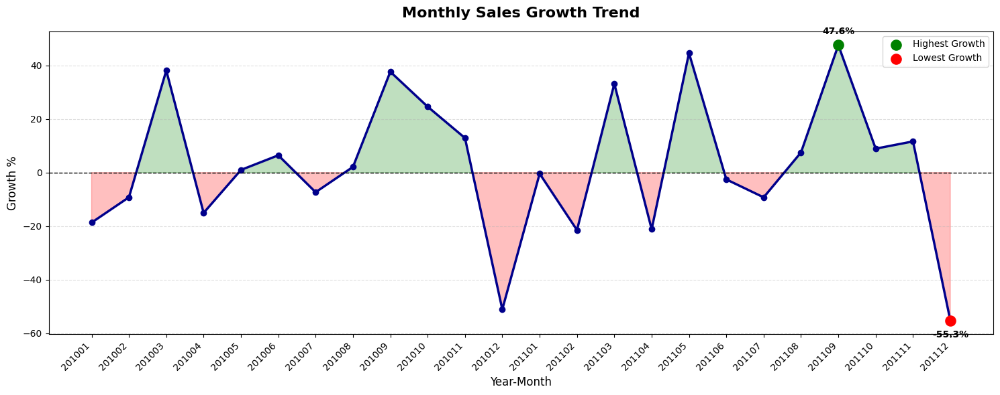

In [0]:
monthly_growth_pd = monthly_growth_df.toPandas().dropna(subset=["growth_pct"])
monthly_growth_pd["yyyymm"] = monthly_growth_pd["yyyymm"].astype(str)

plt.figure(figsize=(15, 6))

plt.plot(
    monthly_growth_pd["yyyymm"],
    monthly_growth_pd["growth_pct"],
    marker="o",
    linewidth=2.5,
    markersize=6,
    color="darkblue"
)

# zero line
plt.axhline(0, color="black", linestyle="--", linewidth=1)

# fill positive / negative areas
plt.fill_between(
    monthly_growth_pd["yyyymm"],
    monthly_growth_pd["growth_pct"],
    0,
    where=monthly_growth_pd["growth_pct"] >= 0,
    alpha=0.25,
    color="green",
    interpolate=True
)

plt.fill_between(
    monthly_growth_pd["yyyymm"],
    monthly_growth_pd["growth_pct"],
    0,
    where=monthly_growth_pd["growth_pct"] < 0,
    alpha=0.25,
    color="red",
    interpolate=True
)

# annotate highest and lowest growth
max_idx = monthly_growth_pd["growth_pct"].idxmax()
min_idx = monthly_growth_pd["growth_pct"].idxmin()

plt.scatter(
    monthly_growth_pd.loc[max_idx, "yyyymm"],
    monthly_growth_pd.loc[max_idx, "growth_pct"],
    s=120,
    color="green",
    zorder=5,
    label="Highest Growth"
)

plt.scatter(
    monthly_growth_pd.loc[min_idx, "yyyymm"],
    monthly_growth_pd.loc[min_idx, "growth_pct"],
    s=120,
    color="red",
    zorder=5,
    label="Lowest Growth"
)

plt.annotate(
    f"{monthly_growth_pd.loc[max_idx, 'growth_pct']:.1f}%",
    xy=(monthly_growth_pd.loc[max_idx, "yyyymm"], monthly_growth_pd.loc[max_idx, "growth_pct"]),
    xytext=(0, 12),
    textcoords="offset points",
    ha="center",
    fontsize=10,
    fontweight="bold"
)

plt.annotate(
    f"{monthly_growth_pd.loc[min_idx, 'growth_pct']:.1f}%",
    xy=(monthly_growth_pd.loc[min_idx, "yyyymm"], monthly_growth_pd.loc[min_idx, "growth_pct"]),
    xytext=(0, -18),
    textcoords="offset points",
    ha="center",
    fontsize=10,
    fontweight="bold"
)

plt.title("Monthly Sales Growth Trend", fontsize=16, fontweight="bold", pad=15)
plt.xlabel("Year-Month", fontsize=12)
plt.ylabel("Growth %", fontsize=12)
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()

# Monthly Active Users

In [0]:
# Monthly active users
monthly_active_users_df = (
    df
    .withColumn("yyyymm", F.year("invoice_date") * 100 + F.month("invoice_date"))
    .groupBy("yyyymm")
    .agg(F.countDistinct("customer_id").alias("active_users"))
    .orderBy("yyyymm")
)

display(monthly_active_users_df.limit(5))

yyyymm,active_users
200912,955
201001,720
201002,772
201003,1057
201004,942


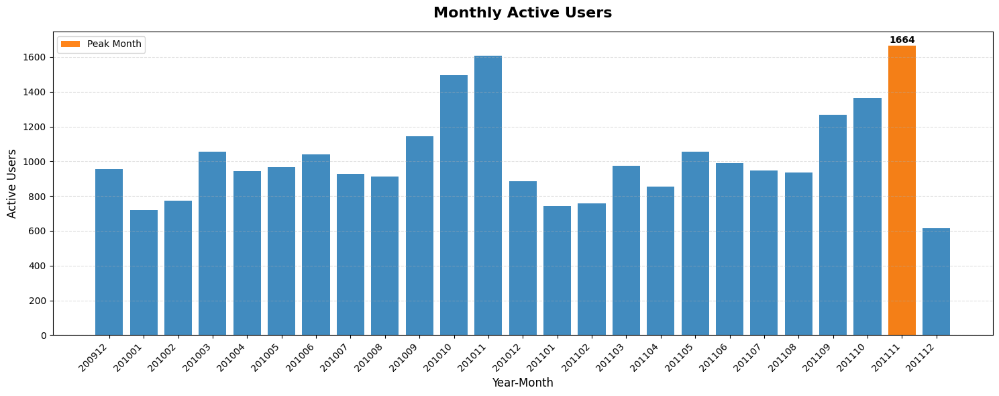

In [0]:
monthly_active_users_pd = monthly_active_users_df.toPandas()
monthly_active_users_pd["yyyymm"] = monthly_active_users_pd["yyyymm"].astype(str)

plt.figure(figsize=(15, 6))

bars = plt.bar(
    monthly_active_users_pd["yyyymm"],
    monthly_active_users_pd["active_users"],
    alpha=0.85
)

# highlight max month
max_idx = monthly_active_users_pd["active_users"].idxmax()
plt.bar(
    monthly_active_users_pd.loc[max_idx, "yyyymm"],
    monthly_active_users_pd.loc[max_idx, "active_users"],
    alpha=0.95,
    label="Peak Month"
)

plt.text(
    max_idx,
    monthly_active_users_pd.loc[max_idx, "active_users"] + 15,
    f"{monthly_active_users_pd.loc[max_idx, 'active_users']}",
    ha="center",
    fontsize=10,
    fontweight="bold"
)

plt.title("Monthly Active Users", fontsize=16, fontweight="bold", pad=15)
plt.xlabel("Year-Month", fontsize=12)
plt.ylabel("Active Users", fontsize=12)
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()

# New and Existing Users



##### Step 1: New vs Existing users by month

In [0]:
# Add YYYYMM to transactional data
user_txn_df = df.withColumn(
    "yyyymm",
    F.year("invoice_date") * 100 + F.month("invoice_date")
)

# First purchase month for each user
first_purchase_df = (
    user_txn_df
    .groupBy("customer_id")
    .agg(F.min("yyyymm").alias("first_purchase_yyyymm"))
)

# Join first purchase month back to transactions
user_status_df = (
    user_txn_df
    .join(first_purchase_df, on="customer_id", how="left")
    .withColumn(
        "user_type",
        F.when(F.col("yyyymm") == F.col("first_purchase_yyyymm"), "New")
         .otherwise("Existing")
    )
)

# Count distinct users by month and user type
monthly_user_type_df = (
    user_status_df
    .groupBy("yyyymm", "user_type")
    .agg(F.countDistinct("customer_id").alias("user_count"))
    .orderBy("yyyymm", "user_type")
)

display(monthly_user_type_df)

yyyymm,user_type,user_count
200912,New,955
201001,Existing,337
201001,New,383
201002,Existing,398
201002,New,374
201003,Existing,614
201003,New,443
201004,Existing,648
201004,New,294
201005,Existing,712


##### Step 2: reshape for plotting

In [0]:
monthly_user_type_pd = monthly_user_type_df.toPandas()

pivot_user_type_pd = (
    monthly_user_type_pd
    .pivot(index="yyyymm", columns="user_type", values="user_count")
    .fillna(0)
    .reset_index()
    .sort_values("yyyymm")
)

pivot_user_type_pd["yyyymm"] = pivot_user_type_pd["yyyymm"].astype(str)

# Make sure both columns exist
if "New" not in pivot_user_type_pd.columns:
    pivot_user_type_pd["New"] = 0

if "Existing" not in pivot_user_type_pd.columns:
    pivot_user_type_pd["Existing"] = 0

pivot_user_type_pd.head()

user_type,yyyymm,Existing,New
0,200912,0.0,955.0
1,201001,337.0,383.0
2,201002,398.0,374.0
3,201003,614.0,443.0
4,201004,648.0,294.0


##### Step 3: plot stacked bar chart

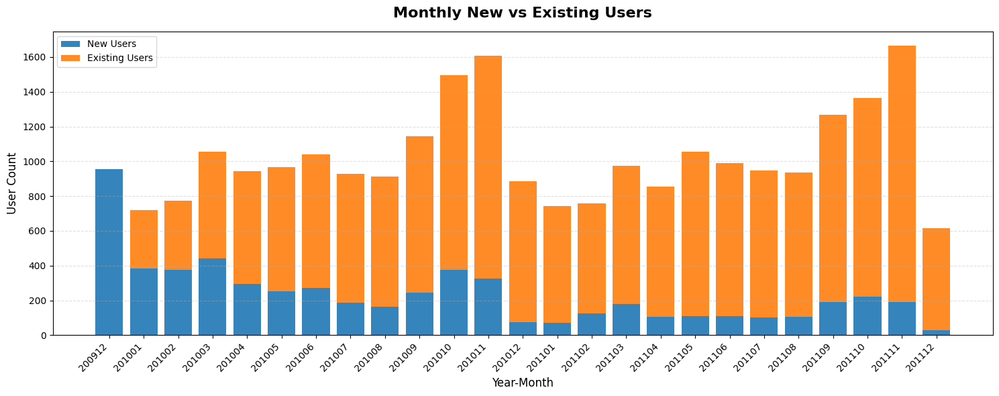

In [0]:
plt.figure(figsize=(15, 6))

plt.bar(
    pivot_user_type_pd["yyyymm"],
    pivot_user_type_pd["New"],
    label="New Users",
    alpha=0.9
)

plt.bar(
    pivot_user_type_pd["yyyymm"],
    pivot_user_type_pd["Existing"],
    bottom=pivot_user_type_pd["New"],
    label="Existing Users",
    alpha=0.9
)

plt.title("Monthly New vs Existing Users", fontsize=16, fontweight="bold", pad=15)
plt.xlabel("Year-Month", fontsize=12)
plt.ylabel("User Count", fontsize=12)
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()

# Finding RFM


#### Segment 1: RFM base dataframe

In [0]:

rfm_df = (
    df
    .filter(F.col("customer_id").isNotNull())
    .withColumn("invoice_date", F.to_timestamp("invoice_date"))
    .withColumn("sales_amount", F.col("quantity") * F.col("unit_price"))
)

display(rfm_df.limit(10))

invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country,sales_amount,year,month,year_month
511362,22644,CERAMIC CHERRY CAKE MONEY BANK,2,2010-06-08T11:14:00.000Z,1.45,15039.0,United Kingdom,2.9000000953674316,2010,6,2010-06
511484,85041,SET/4 PINK ORCHID CANDLES IN BOWL,8,2010-06-08T14:10:00.000Z,1.65,17801.0,United Kingdom,13.199999809265137,2010,6,2010-06
511501,22101,MIRROR MOSAIC VOTIVE HOLDER,6,2010-06-08T14:52:00.000Z,2.1,15532.0,United Kingdom,12.59999942779541,2010,6,2010-06
511705,22109,FULL ENGLISH BREAKFAST PLATE,12,2010-06-10T10:04:00.000Z,3.75,13417.0,United Kingdom,45.0,2010,6,2010-06
511325,22431,WATERING CAN BLUE ELEPHANT,6,2010-06-08T08:50:00.000Z,1.95,13771.0,United Kingdom,11.700000286102295,2010,6,2010-06
511461,84968B,S/16 VINTAGE IVORY CUTLERY,4,2010-06-08T12:54:00.000Z,12.75,12647.0,Germany,51.0,2010,6,2010-06
511512,22556,PLASTERS IN TIN CIRCUS PARADE,3,2010-06-08T15:51:00.000Z,1.65,18145.0,United Kingdom,4.949999928474426,2010,6,2010-06
511522,21136,PAINTED METAL PEARS ASSORTED,8,2010-06-08T16:47:00.000Z,1.69,16072.0,United Kingdom,13.520000457763672,2010,6,2010-06
511783,48185,DOOR MAT FAIRY CAKE,1,2010-06-10T13:17:00.000Z,7.49,16713.0,United Kingdom,7.489999771118164,2010,6,2010-06
511512,84997B,RED 3 PIECE MINI DOTS CUTLERY SET,2,2010-06-08T15:51:00.000Z,3.75,18145.0,United Kingdom,7.5,2010,6,2010-06


#### Segment 2: Snapshot date

In [0]:
snapshot_date = rfm_df.select(
    F.date_add(F.max("invoice_date"), 1).alias("snapshot_date")
).collect()[0]["snapshot_date"]

print("Snapshot Date:", snapshot_date)

Snapshot Date: 2011-12-10


#### Segment 3: RFM KPI table

In [0]:
rfm_table = (
    rfm_df
    .groupBy("customer_id")
    .agg(
        F.datediff(F.lit(snapshot_date), F.max("invoice_date")).alias("recency"),
        F.countDistinct("invoice_no").alias("frequency"),
        F.round(F.sum("sales_amount"), 2).alias("monetary")
    )
)

display(rfm_table.limit(10))

customer_id,recency,frequency,monetary
14911.0,2,398,291420.81
12830.0,38,6,6814.64
17513.0,73,3,1158.8
15693.0,660,1,37.5
16317.0,120,5,2192.51
15371.0,663,1,59.4
14688.0,8,28,7190.42
14898.0,24,14,3365.95
15712.0,10,12,3472.41
17578.0,219,7,1047.33


#### Segment 4: Overall RFM summary KPI

In [0]:
rfm_summary = (
    rfm_table
    .agg(
        F.count("*").alias("total_customers"),
        F.round(F.avg("recency"), 2).alias("avg_recency"),
        F.round(F.avg("frequency"), 2).alias("avg_frequency"),
        F.round(F.avg("monetary"), 2).alias("avg_monetary"),
        F.min("recency").alias("min_recency"),
        F.max("recency").alias("max_recency"),
        F.min("frequency").alias("min_frequency"),
        F.max("frequency").alias("max_frequency"),
        F.round(F.min("monetary"), 2).alias("min_monetary"),
        F.round(F.max("monetary"), 2).alias("max_monetary")
    )
)

display(rfm_summary)

total_customers,avg_recency,avg_frequency,avg_monetary,min_recency,max_recency,min_frequency,max_frequency,min_monetary,max_monetary
5878,201.87,6.29,2955.9,1,739,1,398,2.95,580987.04


#### Segment 5: Quartiles for scoring

In [0]:
quantiles = rfm_table.approxQuantile(
    ["recency", "frequency", "monetary"],
    [0.25, 0.50, 0.75],
    0.0
)

r_quartiles = quantiles[0]
f_quartiles = quantiles[1]
m_quartiles = quantiles[2]

print("Recency quartiles:", r_quartiles)
print("Frequency quartiles:", f_quartiles)
print("Monetary quartiles:", m_quartiles)

Recency quartiles: [26.0, 96.0, 380.0]
Frequency quartiles: [1.0, 3.0, 7.0]
Monetary quartiles: [342.24, 867.11, 2248.5]


#### Segment 6: RFM scoring

In [0]:
rfm_scored = (
    rfm_table
    .withColumn(
        "r_score",
        F.when(F.col("recency") <= r_quartiles[0], 4)
         .when(F.col("recency") <= r_quartiles[1], 3)
         .when(F.col("recency") <= r_quartiles[2], 2)
         .otherwise(1)
    )
    .withColumn(
        "f_score",
        F.when(F.col("frequency") <= f_quartiles[0], 1)
         .when(F.col("frequency") <= f_quartiles[1], 2)
         .when(F.col("frequency") <= f_quartiles[2], 3)
         .otherwise(4)
    )
    .withColumn(
        "m_score",
        F.when(F.col("monetary") <= m_quartiles[0], 1)
         .when(F.col("monetary") <= m_quartiles[1], 2)
         .when(F.col("monetary") <= m_quartiles[2], 3)
         .otherwise(4)
    )
    .withColumn(
        "rfm_score",
        F.concat(
            F.col("r_score").cast("string"),
            F.col("f_score").cast("string"),
            F.col("m_score").cast("string")
        )
    )
)

display(rfm_scored.limit(20))

customer_id,recency,frequency,monetary,r_score,f_score,m_score,rfm_score
14911.0,2,398,291420.81,4,4,4,444
12830.0,38,6,6814.64,3,3,4,334
17513.0,73,3,1158.8,3,2,3,323
15693.0,660,1,37.5,1,1,1,111
16317.0,120,5,2192.51,2,3,3,233
15371.0,663,1,59.4,1,1,1,111
14688.0,8,28,7190.42,4,4,4,444
14898.0,24,14,3365.95,4,4,4,444
15712.0,10,12,3472.41,4,4,4,444
17578.0,219,7,1047.33,2,3,3,233


#### Segment 7: Customer segmentation

In [0]:
rfm_segmented = (
    rfm_scored
    .withColumn(
        "segment",
        F.when((F.col("r_score") == 4) & (F.col("f_score") == 4) & (F.col("m_score") == 4), "Champions")
         .when((F.col("r_score") >= 3) & (F.col("f_score") >= 3) & (F.col("m_score") >= 3), "Loyal Customers")
         .when((F.col("r_score") == 4) & (F.col("f_score") <= 2), "Recent Customers")
         .when((F.col("r_score") >= 3) & (F.col("f_score") <= 2) & (F.col("m_score") <= 2), "Promising")
         .when((F.col("r_score") == 2) & (F.col("f_score") >= 2), "Potential Loyalists")
         .when((F.col("r_score") == 2) & (F.col("f_score") <= 2), "Needs Attention")
         .when((F.col("r_score") == 1) & (F.col("f_score") >= 3) & (F.col("m_score") >= 3), "At Risk")
         .when((F.col("r_score") == 1) & (F.col("f_score") >= 2), "Cannot Lose Them")
         .when((F.col("r_score") == 1) & (F.col("f_score") <= 2) & (F.col("m_score") <= 2), "Hibernating")
         .otherwise("Others")
    )
)

display(rfm_segmented.limit(20))

customer_id,recency,frequency,monetary,r_score,f_score,m_score,rfm_score,segment
14911.0,2,398,291420.81,4,4,4,444,Champions
12830.0,38,6,6814.64,3,3,4,334,Loyal Customers
17513.0,73,3,1158.8,3,2,3,323,Others
15693.0,660,1,37.5,1,1,1,111,Hibernating
16317.0,120,5,2192.51,2,3,3,233,Potential Loyalists
15371.0,663,1,59.4,1,1,1,111,Hibernating
14688.0,8,28,7190.42,4,4,4,444,Champions
14898.0,24,14,3365.95,4,4,4,444,Champions
15712.0,10,12,3472.41,4,4,4,444,Champions
17578.0,219,7,1047.33,2,3,3,233,Potential Loyalists


#### Segment 8: Segment summary KPI

In [0]:
rfm_segment_summary = (
    rfm_segmented
    .groupBy("segment")
    .agg(
        F.count("*").alias("customer_count"),
        F.round(F.avg("recency"), 2).alias("avg_recency"),
        F.round(F.avg("frequency"), 2).alias("avg_frequency"),
        F.round(F.avg("monetary"), 2).alias("avg_monetary")
    )
    .orderBy(F.desc("customer_count"))
)

display(rfm_segment_summary)

segment,customer_count,avg_recency,avg_frequency,avg_monetary
Loyal Customers,1133,39.81,8.45,3367.65
Potential Loyalists,1062,219.13,5.13,1988.05
Hibernating,809,542.94,1.0,243.93
Champions,626,10.53,25.32,14803.5
Cannot Lose Them,484,483.77,2.49,794.22
Promising,475,55.94,1.68,397.95
Needs Attention,402,247.87,1.0,334.49
Recent Customers,397,14.25,2.09,1109.86
Others,357,101.63,3.22,1281.55
At Risk,133,455.82,6.8,2838.97


#### Segment 9: Top customers KPI

In [0]:
top_customers = (
    rfm_segmented
    .select("customer_id", "recency", "frequency", "monetary", "rfm_score", "segment")
    .orderBy(F.desc("monetary"))
)

display(top_customers.limit(10))

customer_id,recency,frequency,monetary,rfm_score,segment
18102.0,1,145,580987.04,444,Champions
14646.0,2,151,528602.52,444,Champions
14156.0,10,156,313437.62,444,Champions
14911.0,2,398,291420.81,444,Champions
17450.0,9,51,244784.25,444,Champions
13694.0,4,143,195640.69,444,Champions
17511.0,3,60,172132.87,444,Champions
16446.0,1,2,168472.49,424,Recent Customers
16684.0,5,55,147142.77,444,Champions
12415.0,25,28,144458.37,444,Champions


#### Segment 10: Segment distribution chart

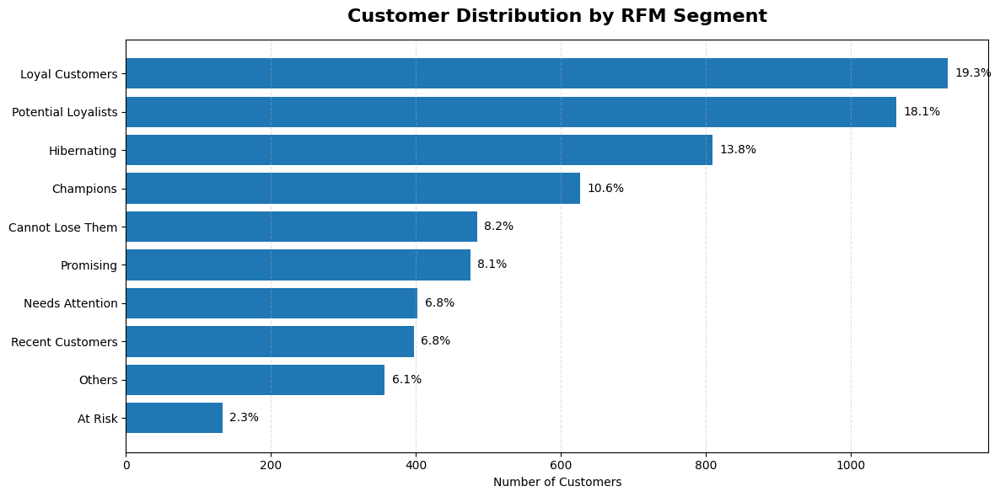

In [0]:
rfm_segment_pd = rfm_segment_summary.toPandas()
rfm_segment_pd = rfm_segment_pd.sort_values("customer_count", ascending=False)

total_customers = rfm_segment_pd["customer_count"].sum()
rfm_segment_pd["percentage"] = (
    rfm_segment_pd["customer_count"] / total_customers * 100
).round(1)

plt.figure(figsize=(12, 6))

plt.barh(
    rfm_segment_pd["segment"],
    rfm_segment_pd["customer_count"]
)

plt.title("Customer Distribution by RFM Segment", fontsize=16, fontweight="bold", pad=15)
plt.xlabel("Number of Customers")

for i, value in enumerate(rfm_segment_pd["customer_count"]):
    pct = rfm_segment_pd["percentage"].iloc[i]
    plt.text(value + 10, i, f"{pct}%", va="center")

plt.gca().invert_yaxis()
plt.grid(axis="x", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()

#### Segment 11: Average monetary by segment chart

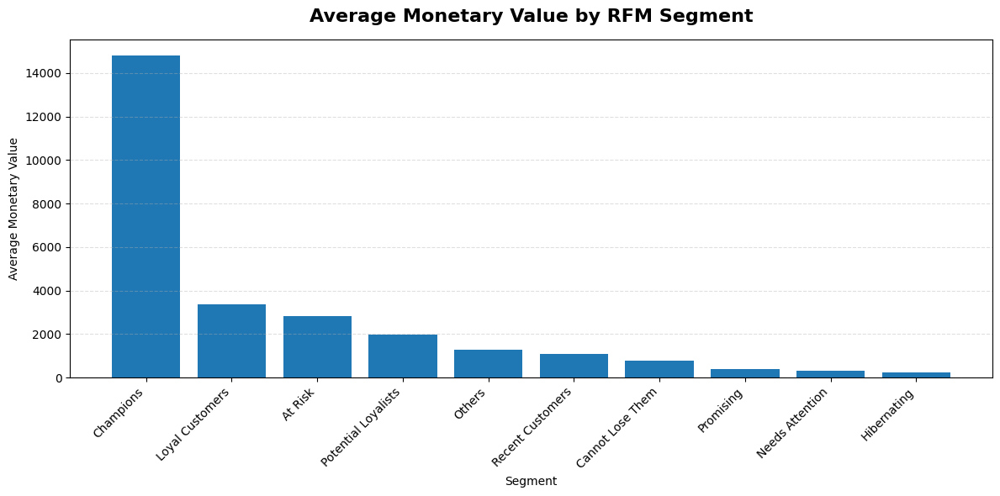

In [0]:
rfm_monetary_pd = rfm_segment_summary.toPandas().sort_values("avg_monetary", ascending=False)

plt.figure(figsize=(12, 6))

plt.bar(
    rfm_monetary_pd["segment"],
    rfm_monetary_pd["avg_monetary"]
)

plt.title("Average Monetary Value by RFM Segment", fontsize=16, fontweight="bold", pad=15)
plt.xlabel("Segment")
plt.ylabel("Average Monetary Value")
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()